# Notebook for width analysis of braided rivers processing in low-flow

In [ ]:
import os
import sys
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from rasterio import shutil as rio_shutil
from rasterio.warp import transform
from skimage.morphology import label, binary_dilation
from shapely.geometry import MultiPoint


# append braidedSP directory to path
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..', 'braidedSP')))
import procBraided as pc
import tools as skel
import mask
import datetime

import geopandas as gpd
import pandas as pd
import shapely
from shapely.geometry import Point, LineString
from shapely.ops import transform
import pyproj
from functools import partial
from scipy.spatial import cKDTree


Text(0.5, 1.0, 'Processed Water Mask')

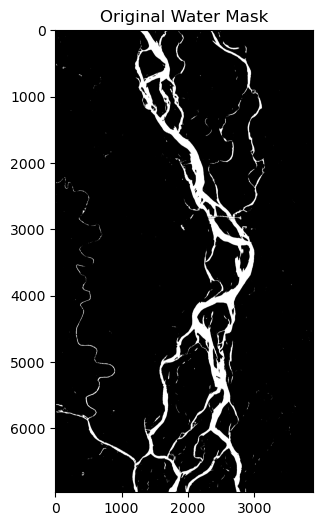

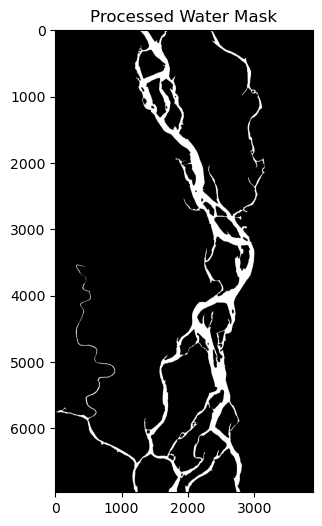

In [ ]:
# -------------------- Load in the water mask and plot -------------------- #

water_mask = mask.Mask(river_name='brahmaputra',date=datetime.datetime(2024, 2, 3), path=r'..\data\brahmaputra\S2\S2_WaterMask_NDWI_0224.tif', odir=r'..\data\brahmaputra\masks')
water_mask.process(save_progress=True)

fig, ax = plt.subplots(figsize=(4, 6))
ax.imshow(water_mask.array,cmap=plt.cm.gray)
ax.set_title('Original Water Mask')

fig, ax = plt.subplots(figsize=(4, 6))
ax.imshow(water_mask.smoothed,cmap=plt.cm.gray)
ax.set_title('Processed Water Mask')

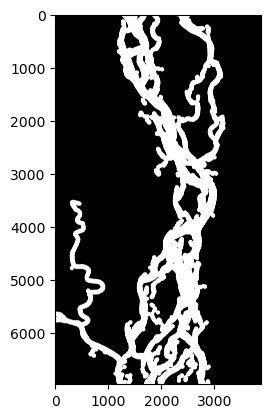

In [ ]:
# -------------------- Very Dilated version of the water mask ( for reducing the PIXC data size without affecting the width estimation ) -------------------- #

dilated_mask = binary_dilation(water_mask.array, footprint=skel.createKernel(40)) # OG 10
labeled_mask, num_features = label(dilated_mask, return_num=True)
component_sizes = np.bincount(labeled_mask.ravel())
component_sizes[0] = 0
oversmoothed_mask = (labeled_mask == component_sizes.argmax())
plt.imshow(oversmoothed_mask,cmap=plt.cm.gray)

# Write to file
original_tif = r'..\data\brahmaputra\S2\S2_WaterMask_NDWI_0224.tif'  # Has desired metadata
output_oversmoothed_mask_tiff = r'..\data\brahmaputra\masks\figs\brahmaputra_2024-02-03_oversmoothed_mask.tif'

# Load the original to get metadata
with rasterio.open(original_tif) as src:
    meta = src.meta.copy()

# Write the new GeoTIFF using the copied metadata
with rasterio.open(output_oversmoothed_mask_tiff, 'w', **meta) as dst:
    dst.write(oversmoothed_mask, 1)  # 1 = write to band 1


No centerline buffer to trim to.


<Axes: >

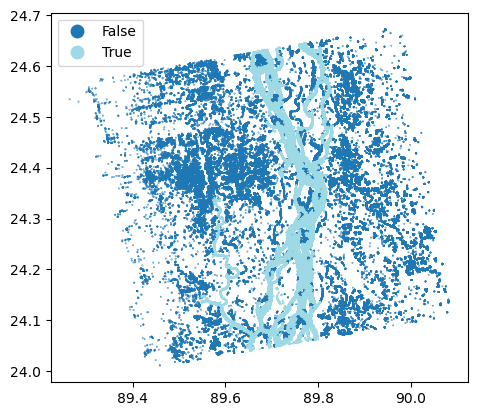

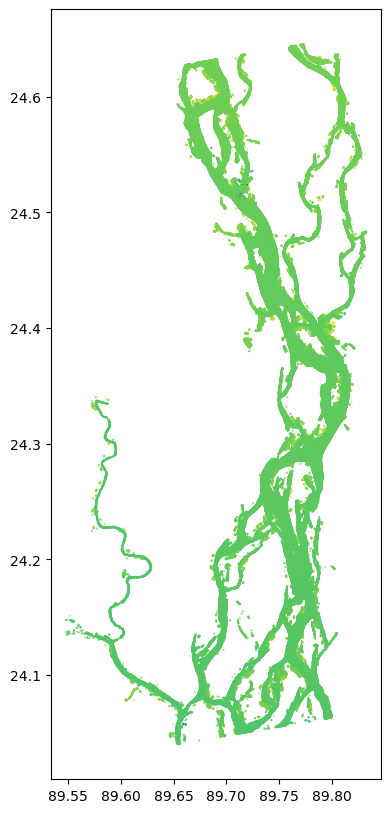

In [ ]:
# -------------------- Import SWOT data and trim to (overdilated) water mask -------------------- #

# Import original SWOT tile for 02-2024
pixc_file = r"..\data\brahmaputra\PIXC\SWOT_L2_HR_PIXC_010_258_112L_20240203T045957_20240203T050008_PIC0_01.nc"
pixc = pc.readPIXC(pixc_file,[])
pixcdate = os.path.basename(pixc_file)[29:37]

# Import SWOT braided channel product for 02-2024
braided_gdf = gpd.read_file(r"..\odir\258_112L\0224_generated_cl.geojson")

# Trim PIXC to a dilated version of the water mask - removes the excess data dar from the river for processing but does not affect width estimation
trimmed_gdf, pixc_gdf = pc.trim2mask_general(pixc,oversmoothed_mask,output_oversmoothed_mask_tiff) # Trimming to largest component mask

# plot the trimmed PIXC
fig, ax = plt.subplots(figsize=(10, 10))
trimmed_gdf.plot(ax=ax, column='heightEGM', alpha=0.5, label='Trimmed PIXC',s=0.2)

<Axes: title={'center': 'band = 1, spatial_ref = 0'}, xlabel='x coordinate of projection\n[metre]', ylabel='y coordinate of projection\n[metre]'>

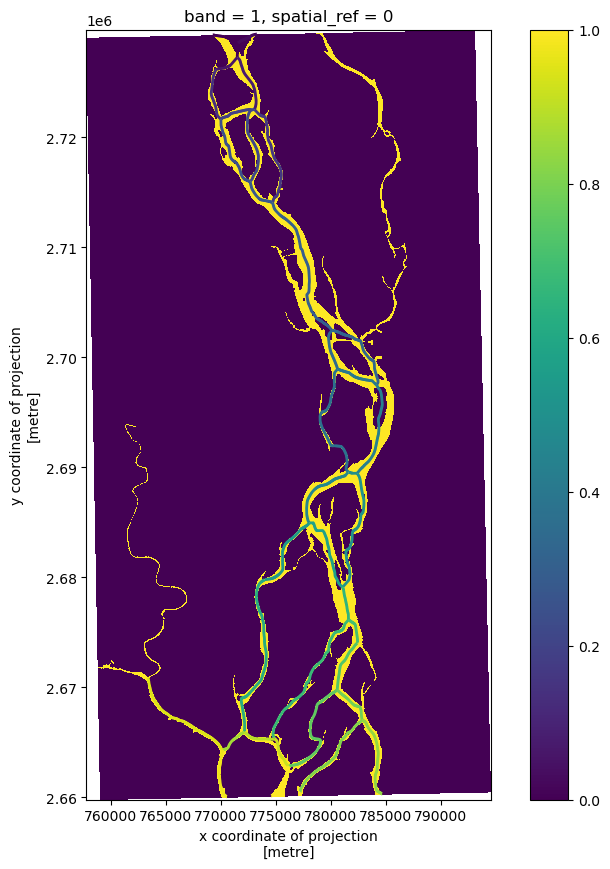

In [ ]:
# -------------------- Reproject water mask to UTM and plot -------------------- #


import rioxarray
cmap = plt.get_cmap('viridis')

braided_gdf['color'] = [cmap(i / (len(braided_gdf.branch_id) - 1)) for i in range(len(braided_gdf.branch_id))] if len(braided_gdf.branch_id) > 1 else [cmap(0.5)]

# import river mask from tif
tiff_path = r"..\data\brahmaputra\masks\figs\brahmaputra_2024-02-03_smoothed_mask.tif"
rds = rioxarray.open_rasterio(tiff_path)
rds_utm = rds.rio.reproject('EPSG:32645')
rds_utm.rio.to_raster(r"..\data\brahmaputra\masks\figs\brahmaputra_2024-02-03_smoothed_mask_UTM.tif")

rds_utm = rds_utm.where(rds_utm != 255)

fig, ax = plt.subplots(figsize=(10, 10))
rds_utm[0,:,:].plot.imshow(ax=ax)
braided_gdf.to_crs(rds_utm.rio.crs).plot(ax=ax, color=braided_gdf.color, linewidth=2, label='Generated CL')
##braided_gdf.plot(ax=ax, color=braided_gdf.color, linewidth=2, label='generated CL')



<Axes: >

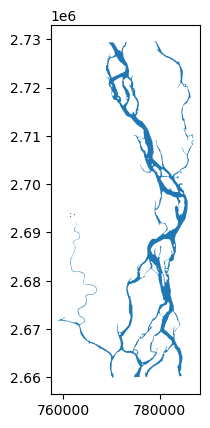

In [ ]:
# -------------------- Transform water mask raster to vector shape (for computing intersecting widths later) -------------------- #

from shapely.geometry import shape

binary_mask = (rds_utm[0,:,:] > 0).values.astype(np.uint8)  # binary mask: water=1, else=0

# Get transform for the raster (important for spatial coordinates)
transform = rds_utm.rio.transform()

# Extract polygons from water mask raster
polygons = []
values = []

for geom, val in rasterio.features.shapes(binary_mask, transform=transform):
    if val == 1:  # water polygons only
        polygons.append(shape(geom))

water_gdf = gpd.GeoDataFrame(geometry=polygons, crs='EPSG:32645')
water_gdf.plot()

Processing channel: 1
No intersections found for channel 1. Skipping plotting.
Processing channel: 2
No intersections found for channel 2. Skipping plotting.
Processing channel: 3
Processing channel: 4
Processing channel: 5
Channel contains only one point....skipping channel No.  5
Processing channel: 6
Processing channel: 7
Processing channel: 8
Processing channel: 9
Processing channel: 10
Processing channel: 11
Processing channel: 12
Processing channel: 13


C:\Users\safr\AppData\Local\Temp\ipykernel_7652\484226240.py:93: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 10))


Processing channel: 14
Processing channel: 15
Processing channel: 16
Processing channel: 17
Processing channel: 18
Processing channel: 19
Processing channel: 20
Processing channel: 21
Processing channel: 22
Processing channel: 23
Channel contains only one point....skipping channel No.  23
Processing channel: 24
Processing channel: 25
Processing channel: 26
Processing channel: 27
Processing channel: 28
Processing channel: 29
Processing channel: 30
Processing channel: 31
Processing channel: 32
Processing channel: 33
Processing channel: 34
Processing channel: 35
Processing channel: 36
Processing channel: 37
Processing channel: 38


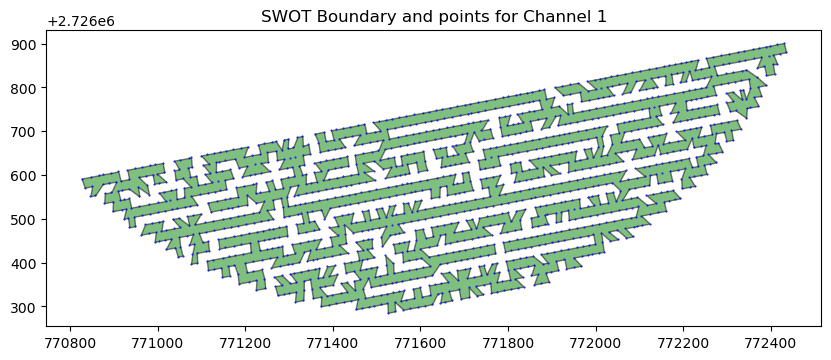

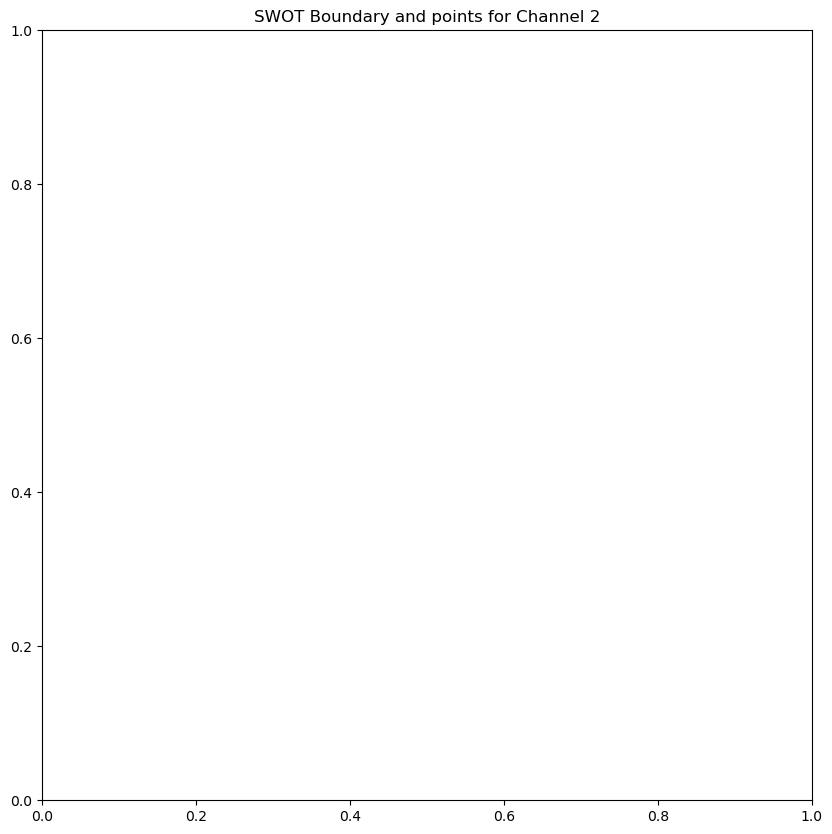

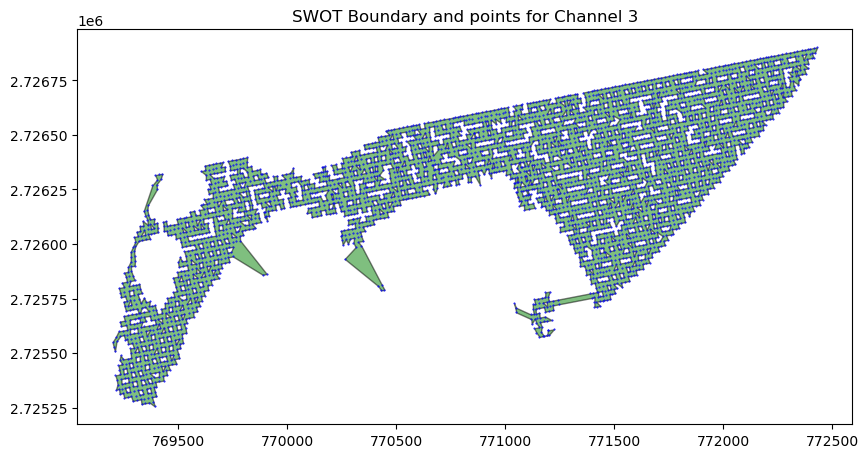

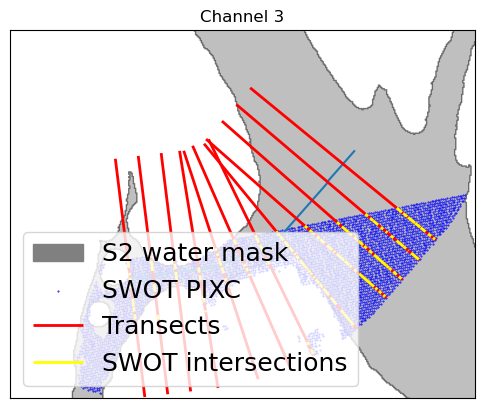

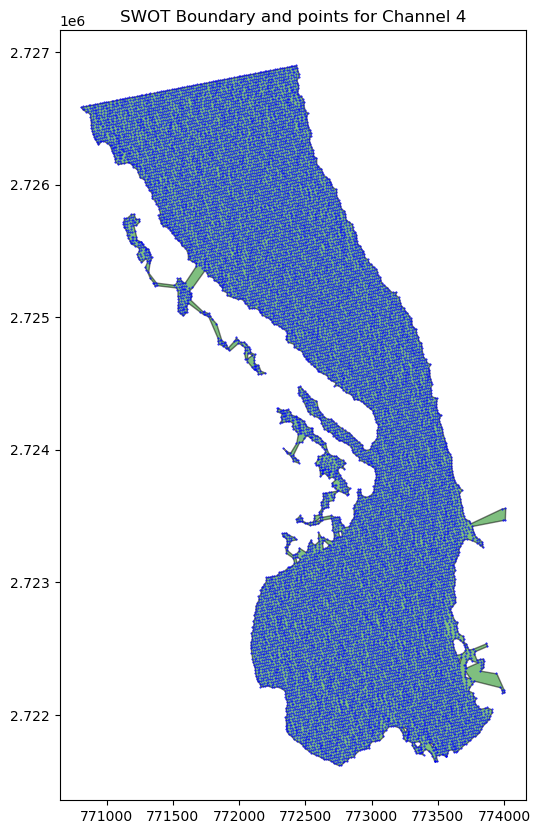

...

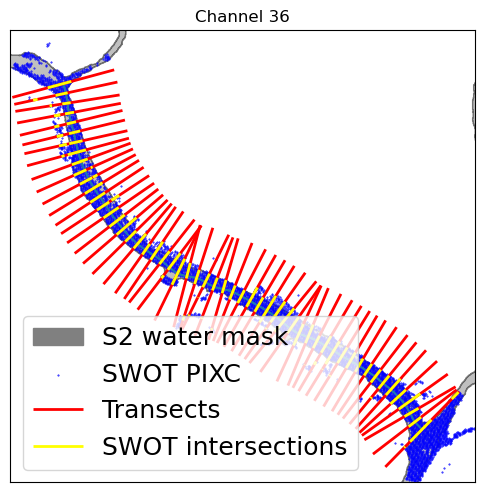

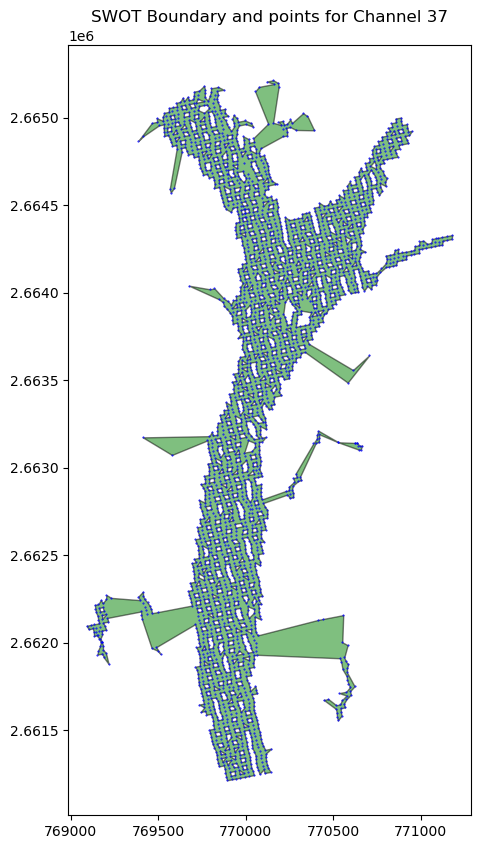

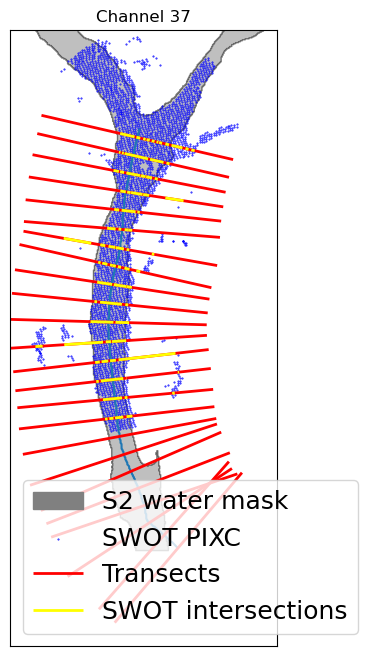

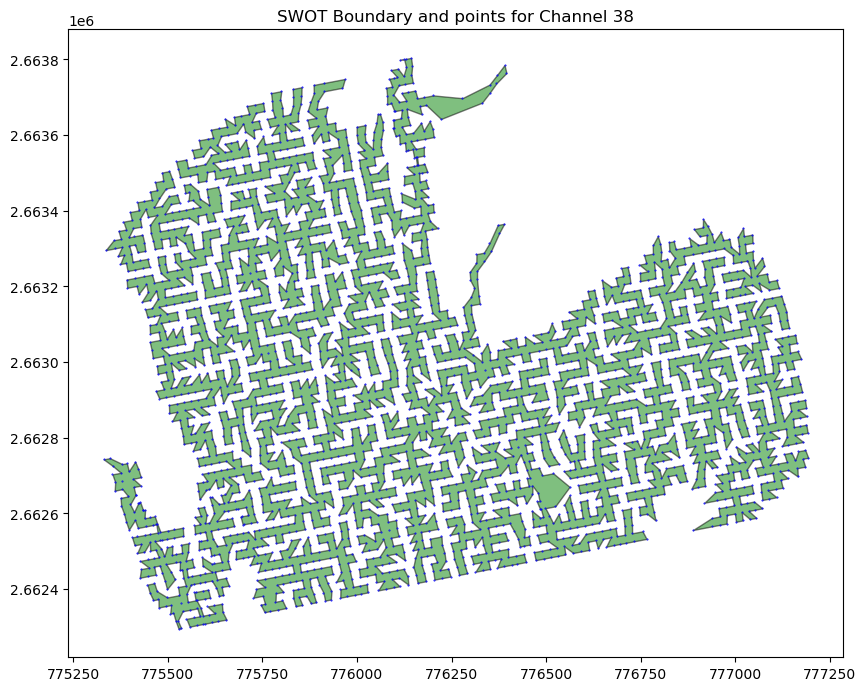

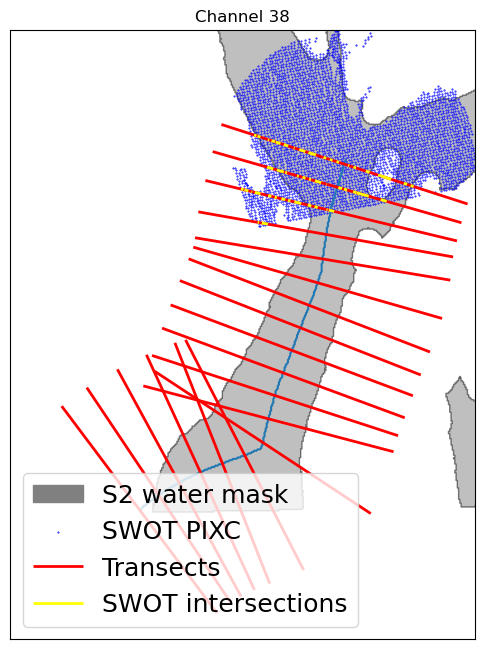

In [ ]:
# -------------------- Extract widths from S2 water mask and SWOT PIXC data -------------------- #

import matplotlib.patches as mpatches
import rioxarray
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
warnings.filterwarnings("ignore", category=UserWarning) 


# Function from stack exchange: https://gis.stackexchange.com/questions/177583/interpolating-every-x-distance-along-line-in-shapely
def create_points(row, point_separation):
    # Can be used for many different linestrings!
    geom = row.geometry
    #For each geometry, create a point along it for each distance in the range from 0 to line length, with an interval
    point_list = [geom.interpolate(distance=x) for x in np.arange(start=0, stop=geom.length, step=point_separation)]
    return point_list

def calculate_vector_general(coord1, coord2):
    # Calculate the direction vector for a LineString at the given endpoint.
    vec = np.array(coord2) - np.array(coord1)
    return vec / np.linalg.norm(vec)  # Normalize


cl_gen = braided_gdf
hemi = 'north'
transect_len = 1000 # meters
theta = np.radians(90)
c, s = np.cos(theta), np.sin(theta)
R = np.array(((c,-s), (s, c))) #2D rotation matrix

rds = rioxarray.open_rasterio(tiff_path)
rds_utm = rds.rio.reproject('EPSG:32645')
# mask out 255 values (no data)
rds_utm = rds_utm.where(rds_utm != 255)


transects_gdf_all = gpd.GeoDataFrame()  # Initialize an empty GeoDataFrame to store all transects

# loop through each channel in braided_gdf
for channelID in cl_gen.branch_id:
    print('Processing channel:',channelID)
    sel_channel = cl_gen.loc[cl_gen.branch_id == channelID]

    # convert to UTM
    centroid = sel_channel.geometry.unary_union.centroid
    utm_zone = int((centroid.x + 180) // 6) + 1
    if hemi == 'north':
        utm_crs = f'EPSG:{32600 + utm_zone}'
    elif hemi == 'south':
        utm_crs = f'EPSG:{32700 + utm_zone}'
    else:
        raise ValueError("Invalid hemisphere. Use 'north' or 'south'.")

    sel_channel_utm = sel_channel.to_crs(utm_crs)
    coords_list = list(sel_channel_utm.geometry.iloc[0].coords)
    x_coords = [x for x,y in coords_list]
    y_coords = [y for x,y in coords_list]

    # extract point locations every 100 m along the line
    sel_channel_utm["point_list"] = sel_channel_utm.apply(lambda x: create_points(row=x, point_separation=200), axis=1)
    
    #Create a point dataframe by exploding the point list into individual points/rows
    points_df = sel_channel_utm.explode(column="point_list")
    points_df = points_df.set_geometry("point_list").drop(columns="geometry").rename_geometry("geometry").set_crs(sel_channel_utm.crs)
    points_df = points_df.reset_index(drop=True)

    if len(points_df) <= 1:
        print('Channel contains only one point....skipping channel No. ',channelID)
        continue


    # Prepare Trimmed SWOT PIXC data for intersection with transects
    channel_buffer = sel_channel.geometry.unary_union.buffer(100)  # 1 km buffer around the channel
    buffer_geom = shapely.buffer(sel_channel_utm.geometry.unary_union, 1000)  # 1 km buffer around the channel

    gdf_buffered = gpd.GeoDataFrame(geometry=[buffer_geom], crs=utm_crs)  # Create GeoDataFrame for buffer

    # Trim SWOT PIXC to buffer
    sub_swot_utm = gpd.clip(trimmed_gdf.to_crs(gdf_buffered.crs), gdf_buffered) # Use 'trimmed_gdf' to use water mask trimmed data
    sub_swot_utm = sub_swot_utm.copy()

    # if sub_swot contains no data...break and continue
    # if len(sub_swot_utm.heightEGM) <= 1:
    #     swot_break = True
    #     continue

    # Give each PIXC cloud point a point geometry
    mpt = MultiPoint([shape(row['geometry']) for _, row in sub_swot_utm.iterrows()])
    ratioval = 0.01
    shapeout = shapely.concave_hull(mpt, ratio=ratioval,allow_holes=True)
    swot_boundary = gpd.GeoDataFrame(geometry=[shapeout],crs=utm_crs)

    # # Plot the SWOT boundary
    fig, ax = plt.subplots(figsize=(10, 10))
    swot_boundary.plot(ax=ax, color='green', alpha=0.5, edgecolor='black', label='SWOT Boundary')
    sub_swot_utm.plot(ax=ax, color='blue',markersize=0.2,label='SWOT PIXC')
    ax.set_title(f'SWOT Boundary and points for Channel {channelID}')

    # save transects to a gdf for plotting
    transects_gdf = gpd.GeoDataFrame() # initialize dataframe
    intersects_gdf = gpd.GeoDataFrame() # initialize dataframe
    extract_polys = gpd.GeoDataFrame() # initialize dataframe
    riverSP_gdf_oneChannel = gpd.GeoDataFrame() # initialize dataframe for saving single channels

    #print('Extracting transects, widths and heights...')
    for idx in points_df.index:
        coord = list(points_df.geometry.iloc[idx].coords)
        if idx == 0:
            coord_b4 = coord
            coord_af = list(points_df.geometry.iloc[idx+1].coords)

        if idx == len(points_df.index) - 1:
            coord_b4 = list(points_df.geometry.iloc[idx-1].coords)
            coord_af = coord


        if idx != len(points_df.index) - 1 and idx != 0:
            coord_b4 = list(points_df.geometry.iloc[idx-1].coords)
            coord_af = list(points_df.geometry.iloc[idx+1].coords)

        coord_b4 = [coord_b4[0][0],coord_b4[0][1]]
        coord_af = [coord_af[0][0],coord_af[0][1]]

        # Compute vector and rotated vector
        vec = calculate_vector_general(coord_b4,coord_af)
        rot_vec = np.dot(vec, R)

        pt1 = np.array(coord) - transect_len*rot_vec
        pt2 = np.array(coord) + transect_len*rot_vec
        line = LineString([Point(pt1),Point(pt2)])

        # plot transect
        transect_temp = gpd.GeoDataFrame(geometry=[line],crs=points_df.crs)
        transect_temp['TID'] = idx  # Add transect ID
        transect_temp['branch_id'] = channelID  # Add branch ID
        transects_gdf = pd.concat([transects_gdf,transect_temp])


    # set transect index to TID
    transects_gdf.set_index('TID', inplace=True)
    intersect_rows = []
    swot_intersects_rows = []

    for idx, row in transects_gdf.iterrows():
        intersects = water_gdf.intersection(row.geometry)
        intersects = [geom for geom in intersects if not geom.is_empty]
        swot_intersects = swot_boundary.intersection(row.geometry)
        swot_intersects = [geom for geom in swot_intersects if not geom.is_empty]

        if not intersects:
            transects_gdf.at[idx, 'width_S2'] = 0.0
            continue
        if not swot_intersects:
            transects_gdf.at[idx, 'width_SWOT'] = 0.0
            continue

        total_length = sum(geom.length for geom in intersects)
        total_length_swot = sum(geom.length for geom in swot_intersects)
        transects_gdf.at[idx, 'width_S2'] = total_length
        transects_gdf.at[idx, 'width_SWOT'] = total_length_swot

        # Store each intersecting line separately in intersects_gdf with reference to transect idx
        for geom in intersects:
            # Only keep LineStrings or MultiLineStrings
            if geom.geom_type == 'LineString':
                intersect_rows.append({'transect_idx': idx, 'geometry': geom})
            elif geom.geom_type == 'MultiLineString':
                for part in geom.geoms:
                    intersect_rows.append({'transect_idx': idx, 'geometry': part})

        for geom in swot_intersects:
            # Only keep LineStrings or MultiLineStrings
            if geom.geom_type == 'LineString':
                swot_intersects_rows.append({'transect_idx': idx, 'geometry': geom})
            elif geom.geom_type == 'MultiLineString':
                for part in geom.geoms:
                    swot_intersects_rows.append({'transect_idx': idx, 'geometry': part})

    # Create GeoDataFrame for intersections
    if len(intersect_rows) == 0:
        print(f'No intersections found for channel {channelID}. Skipping plotting.')
        continue
    intersects_gdf = gpd.GeoDataFrame(intersect_rows, crs=transects_gdf.crs)
    intersects_gdf = intersects_gdf[intersects_gdf.is_empty == False]

    swot_intersects_gdf = gpd.GeoDataFrame(swot_intersects_rows, crs=transects_gdf.crs)
    swot_intersects_gdf = swot_intersects_gdf[swot_intersects_gdf.is_empty == False]


    fig, ax = plt.subplots(figsize=(6, 8))
    sel_channel_utm.plot(ax=ax)
    # set axis limits to the extent of sel_channel_utm with 1 km buffer
    ax.set_xlim(sel_channel_utm.total_bounds[[0]] - 1000, sel_channel_utm.total_bounds[[2]] + 1000)
    ax.set_ylim(sel_channel_utm.total_bounds[[1]] - 1000, sel_channel_utm.total_bounds[[3]] + 1000)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    water_gdf.plot(ax=ax, color='gray', alpha=0.5, edgecolor='black',label='S2 Water Mask')
    sub_swot_utm.plot(ax=ax, color='blue',markersize=0.2,label='SWOT PIXC')
    transects_gdf.plot(ax=ax, color='red', linewidth=2, alpha=1,label='Transects')
    #intersects_gdf.plot(ax=ax, color='yellow', linewidth=2, alpha=1)
    swot_intersects_gdf.plot(ax=ax, color='yellow', linewidth=2, alpha=1,label='SWOT intersections')
    #ax.set_title(f'Channel {channelID} - Median Width: {transects_gdf["width_S2"].median():.2f} m')
    ax.set_title(f'Channel {channelID}')
    mask_patch = mpatches.Patch(color='gray', label='S2 water mask')
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=[mask_patch]+handles,loc='lower left',fontsize=18)

    transects_gdf_all = pd.concat([transects_gdf_all, transects_gdf], ignore_index=True)
    
# remove nan values from transects_gdf_all
transects_gdf_all = transects_gdf_all.dropna(subset=['width_S2', 'width_SWOT'])

Text(0.5, 1.0, 'Histogram of Width Differences (SWOT - S2)')

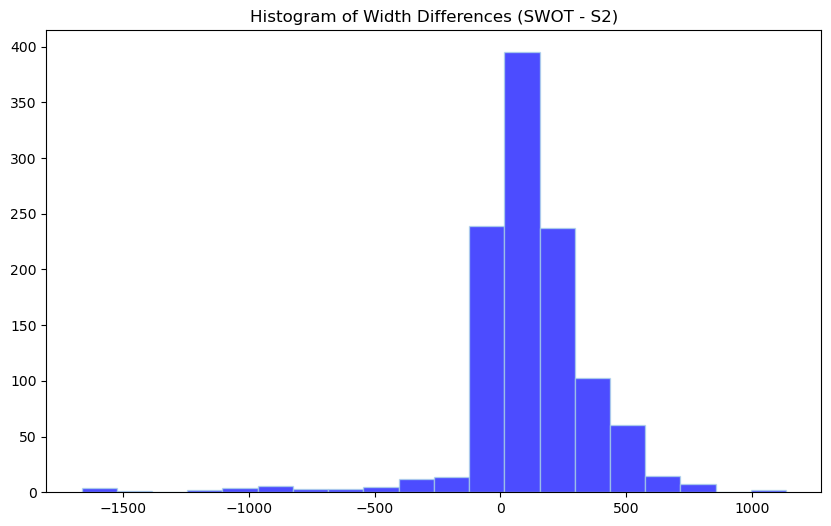

In [ ]:
# -------------------- Compare S2 widths and SWOT widths for each channel -------------------- #

transects_gdf_all['width_diff'] = transects_gdf_all['width_SWOT'] - transects_gdf_all['width_S2']
# Plot histogram of width differences
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(transects_gdf_all['width_diff'], bins=20, color='blue', alpha=0.7,edgecolor='lightblue')
ax.set_title('Histogram of Width Differences (SWOT - S2)')


In [ ]:
# -------------------- calculate standard deviation of width differences -------------------- #

std_dev = transects_gdf_all['width_diff'].std()
print(f'Standard Deviation of Width Differences: {std_dev:.2f} m')

mean = transects_gdf_all['width_diff'].mean()
print(f'Mean of Width Differences: {mean:.2f} m')

median = transects_gdf_all['width_diff'].median()
print(f'Median of Width Differences: {median:.2f} m')



Standard Deviation of Width Differences: 253.33 m
Mean of Width Differences: 115.00 m
Median of Width Differences: 99.81 m
